Predict cancer mortality rate based on socioeconomic factor like Income Inquality, Unemployment, education level
Data source = This analysis Joins data from  http://cancer.gov/ & http://census.gov/ to examine cancer mortality rate
I hypothesized that poorer regions would have  higher death rates.

In [185]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import plotly_express as px
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
from sklearn.pipeline import make_pipeline
import category_encoders as ce
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from pdpbox.pdp import pdp_isolate, pdp_plot
import shap
import plotly.graph_objects as go 

In [131]:
# lnk https://statecancerprofiles.cancer.gov/deathrates/index.php
missing_values = ['*', '**', '_', '* ', '** ']
cancer_death = pd.read_csv('cancerdeath.csv',encoding = 'unicode_escape', na_values = missing_values)
print(cancer_death.shape)
cancer_death.head()

(3173, 11)


,State,FIPS,Met Healthy People Objective of 161.4?,"Age-Adjusted Death Rate() - deaths per 100,000",Lower 95% Confidence Interval,Upper 95% Confidence Interval,Average Annual Count,Recent Trend,Recent 5-Year Trend () in Death Rates,Lower 95% Confidence Interval.1,Upper 95% Confidence Interval.1
0,United States,0.0,Yes,161.0,160.8,161.1,590623,falling,-1.5,-1.6,-1.5
1,"Abbeville County, South Carolina",45001.0,No,181.5,161.8,203.2,65,stable,-0.6,-1.3,0.1
2,"Acadia Parish, Louisiana",22001.0,No,199.2,184.3,214.9,137,falling,-1.0,-1.4,-0.5
3,"Accomack County, Virginia",51001.0,No,208.9,191.0,228.3,106,falling,-0.9,-1.3,-0.5
4,"Ada County, Idaho",16001.0,Yes,149.9,144.6,155.4,631,falling,-1.2,-1.5,-0.9


In [132]:
cancer_death.columns = [col.replace(' ', '') for col in cancer_death]

In [133]:
cancer_death.columns

Index(['State', 'FIPS', 'MetHealthyPeopleObjectiveof161.4?',
       'Age-AdjustedDeathRate()-deathsper100,000',
       'Lower95%ConfidenceInterval', 'Upper95%ConfidenceInterval',
       'AverageAnnualCount', 'RecentTrend', 'Recent5-YearTrend()inDeathRates',
       'Lower95%ConfidenceInterval.1', 'Upper95%ConfidenceInterval.1'],
      dtype='object')

In [134]:
cancer_death.isna().sum()

State                                         12
FIPS                                          31
MetHealthyPeopleObjectiveof161.4?             31
Age-AdjustedDeathRate()-deathsper100,000     91
Lower95%ConfidenceInterval                    91
Upper95%ConfidenceInterval                    31
AverageAnnualCount                            31
RecentTrend                                  110
Recent5-YearTrend()inDeathRates             110
Lower95%ConfidenceInterval.1                 110
Upper95%ConfidenceInterval.1                 110
dtype: int64

In [135]:
cancer_death= cancer_death.dropna(how = 'all')

In [136]:
cancer_death = cancer_death.iloc[:3142]
cancer_death[cancer_death['Age-AdjustedDeathRate()-deathsper100,000'].isnull()]

,State,FIPS,MetHealthyPeopleObjectiveof161.4?,"Age-AdjustedDeathRate()-deathsper100,000",Lower95%ConfidenceInterval,Upper95%ConfidenceInterval,AverageAnnualCount,RecentTrend,Recent5-YearTrend()inDeathRates,Lower95%ConfidenceInterval.1,Upper95%ConfidenceInterval.1
33,"Aleutians East Borough, Alaska (3)",2013.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
54,"Alpine County, California",6003.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
88,"Arthur County, Nebraska",31005.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
128,"Banner County, Nebraska",31007.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
208,"Billings County, North Dakota",38007.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
215,"Blaine County, Nebraska",31009.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
240,"Borden County, Texas",48033.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
272,"Bristol Bay Borough, Alaska",2060.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
364,"Camas County, Idaho",16025.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN
411,"Carter County, Montana",30011.0,***,NaN,NaN,*,3 or fewer,NaN,NaN,NaN,NaN


In [137]:
cancer_death['FIPS']= cancer_death['FIPS'].replace([2270,46113,2232,2201,2280],[2158,46102,2105,2198,2195])

In [138]:
cancer_death= cancer_death.dropna(subset= ['Age-AdjustedDeathRate()-deathsper100,000'])
cancer_death= cancer_death.reset_index(drop = True )
cancer_death.shape

(3082, 11)

In [139]:
import zipfile
with zipfile.ZipFile("socioeconomic.zip","r") as zip_ref:
    zip_ref.extractall("targetdir")
    
income_2016 = pd.read_csv('Income.csv',encoding = 'unicode_escape')
print(income_2016.shape)
income_2016.head()

(3278, 11)


,FIPS,State,County,MedHHInc,PerCapitaInc,PovertyUnder18Pct,PovertyAllAgesPct,Deep_Pov_All,Deep_Pov_Children,PovertyUnder18Num,PovertyAllAgesNum
0,0,US,United States,60336.0,31177.0,18.4,13.4,6.477016,8.989297,13353202.0,42583651.0
1,1000,AL,Alabama,48193.0,25746.0,24.4,16.9,7.842565,12.099103,262909.0,802263.0
2,1001,AL,Autauga,58343.0,27824.0,19.3,13.4,5.854320,9.668756,2542.0,7390.0
3,1003,AL,Baldwin,56607.0,29364.0,14.7,10.1,5.003669,6.789429,6734.0,21199.0
4,1005,AL,Barbour,32490.0,17561.0,50.3,33.4,12.683073,26.613051,2606.0,7414.0


In [140]:
income_2016.isna().sum()

FIPS                  0
State                 0
County                0
MedHHInc             85
PerCapitaInc          5
PovertyUnder18Pct    85
PovertyAllAgesPct    85
Deep_Pov_All          5
Deep_Pov_Children     6
PovertyUnder18Num    85
PovertyAllAgesNum    85
dtype: int64

In [141]:
# U.S median doesnot include data from  puerto Rico(PR)
income_2016 = income_2016.loc[income_2016['State'] !='PR']
income_2016 = income_2016.reset_index(drop = True )
income_2016.shape

(3199, 11)

In [142]:
population_2016 = pd.read_csv('People.csv', encoding = 'unicode_escape')
print(population_2016.shape)
pd.options.display.max_columns = 90
population_2016.head()

(3273, 90)


,FIPS,State,County,PopChangeRate1718,PopChangeRate1018,TotalPopEst2018,NetMigrationRate1018,NaturalChangeRate1018,Net_International_Migration_Rate_2010_2018,PopChangeRate0010,NetMigrationRate0010,NaturalChangeRate0010,Immigration_Rate_2000_2010,PopDensity2010,Under18Pct2010,Age65AndOlderPct2010,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,MultipleRacePct2010,NonHispanicWhitePopChangeRate0010,NonHispanicBlackPopChangeRate0010,NonHispanicAsianPopChangeRate0010,NonHispanicNativeAmericanPopChangeRate0010,HispanicPopChangeRate0010,MultipleRacePopChangeRate0010,WhiteNonHispanicNum2010,BlackNonHispanicNum2010,AsianNonHispanicNum2010,NativeAmericanNonHispanicNum2010,HispanicNum2010,MultipleRaceNum2010,ForeignBornPct,ForeignBornEuropePct,ForeignBornMexPct,NonEnglishHHPct,Ed1LessThanHSPct,Ed2HSDiplomaOnlyPct,Ed3SomeCollegePct,Ed4AssocDegreePct,Ed5CollegePlusPct,AvgHHSize,FemaleHHPct,HH65PlusAlonePct,OwnHomePct,Ed5CollegePlusNum,Ed3SomeCollegeNum,Ed2HSDiplomaOnlyNum,Ed1LessThanHSNum,TotalPop25Plus,ForeignBornAfricaPct,TotalPopACS,TotalOccHU,ForeignBornAsiaPct,Ed4AssocDegreeNum,ForeignBornNum,HH65PlusAloneNum,OwnHomeNum,FemaleHHNum,TotalHH,NonEnglishHHNum,ForeignBornCentralSouthAmPct,ForeignBornCentralSouthAmNum,ForeignBornCaribPct,ForeignBornCaribNum,ForeignBornAfricaNum,ForeignBornAsiaNum,ForeignBornMexNum,ForeignBornEuropeNum,Age65AndOlderNum2010,TotalPop2010,LandAreaSQMiles2010,Under18Num2010,Net_International_Migration_2000_2010,NaturalChangeNum0010,NetMigrationNum0010,TotalPopEst2012,TotalPopEst2013,TotalPopEst2010,TotalPopEst2014,TotalPopEst2011,Net_International_Migration_2010_2018,NaturalChange1018,TotalPopEst2015,TotalPopEst2016,TotalPopEst2017,NetMigration1018,TotalPopEstBase2010
0,0,US,United States,0.72,5.30,NaN,2.28,3.02,2.28,9.71,NaN,NaN,NaN,87.42,24.03,13.04,63.75,12.21,4.69,0.73,16.35,2.92,1.16,11.01,42.89,8.61,42.97,31.98,196817552,37685848,14465124,2247098,50477594,9009073,13.404007,1.493630,3.586720,4.464884,12.686413,27.323791,20.777497,8.284711,30.927588,2.63,12.701102,10.528453,63.818681,66887603,44935834,59093612,27437114,216271644,0.634726,321004407,118825921,4.085250,17917481,43027453.0,12510531,75833135,15092201,118825921,5305440,5.557108,17838561.0,1.299269,4170710.0,2037497.0,13113834.0,11513528.0,4794619.0,40267984,308745538,3531905.43,74181467,NaN,NaN,NaN,313993272,316234505,309338421,318622525,311644280,7042455.0,9338302.0,321039839,323405935,325719178,7042455.0,308758105
1,1000,AL,Alabama,0.26,2.14,4887871.0,0.84,1.30,0.77,7.48,3.30,3.30,1.222931,94.38,23.69,13.76,67.04,26.04,1.11,0.54,3.88,1.49,2.51,8.20,70.83,19.84,144.76,61.28,3204402,1244437,52937,25907,185602,71251,3.461841,0.375260,1.078220,1.149408,14.681486,30.902141,21.735822,8.156076,24.524474,2.55,14.776848,11.208411,68.574375,803578,712204,1012551,481059,3276637,0.169973,4850771,1856695,1.091208,267245,167926.0,208106,1273217,274361,1856695,21341,1.596715,77453.0,0.137793,6684.0,8245.0,52932.0,52302.0,18203.0,657792,4779736,50645.33,1132459,54447.0,147019.5,147119.0,4815564,4830460,4785448,4842481,4798834,36623.0,62441.0,4853160,4864745,4875120,39982.0,4780138
2,1001,AL,Autauga,0.28,1.55,55601.0,0.28,1.26,0.06,24.96,11.87,5.46,-0.010222,91.80,26.78,12.00,77.25,17.58,0.86,0.40,2.40,1.59,21.05,29.17,140.72,16.67,114.75,114.57,42154,9595,467,217,1310,869,2.113162,0.337961,0.506941,0.750451,12.299698,33.634410,21.473461,7.628479,24.963952,2.59,11.408758,11.380260,73.287736,9176,7893,12363,4521,36757,0.000000,55036,21054,0.848536,2804,1163.0,2396,15430,2402,21054,158,0.654117,360.0,0.158078,87.0,0.0,467.0,279.0,186.0,6546,54571,594.44,14613,-4.5,2403.5,5224.0,54936,54713,54754,54876,55208,32.0,692.0,54838,55242,55443,155.0,54574
3,1003,AL,Baldwin,2.54,19.07,218022.0,18.14,0.93,0.74,29.80,26.17,3.32,1.584455,114.65,22.99,16.77,83.50,9.31,0.74,0.63,4.38,1.49,25.92,18.17,152.35,52.19,224.09,85.74,152200,16966,1340,1146,7992,2723,3.248426,0.741542,0.716463,0.901055,9.786606,27.8

In [143]:
income_population = pd.merge(income_2016[['FIPS' , 'State', 'MedHHInc', 'PovertyAllAgesPct']] , population_2016[['FIPS' , 'State' , 'County','TotalPopEst2016',
                                                                                                                           'Ed2HSDiplomaOnlyPct','ForeignBornPct',
                                                                                                                 'WhiteNonHispanicPct2010','BlackNonHispanicPct2010']], how= 'left')
print(income_population.shape)
income_population.head()

(3199, 10)


,FIPS,State,MedHHInc,PovertyAllAgesPct,County,TotalPopEst2016,Ed2HSDiplomaOnlyPct,ForeignBornPct,WhiteNonHispanicPct2010,BlackNonHispanicPct2010
0,0,US,60336.0,13.4,United States,323405935.0,27.323791,13.404007,63.75,12.21
1,1000,AL,48193.0,16.9,Alabama,4864745.0,30.902141,3.461841,67.04,26.04
2,1001,AL,58343.0,13.4,Autauga,55242.0,33.634410,2.113162,77.25,17.58
3,1003,AL,56607.0,10.1,Baldwin,207712.0,27.807610,3.248426,83.50,9.31
4,1005,AL,32490.0,33.4,Barbour,25819.0,35.526744,2.660204,46.75,46.69


In [144]:
employment = pd.read_csv('Jobs.csv' , encoding= 'unicode_escape')
print(employment.shape)
employment.head()

(3278, 66)


,FIPS,State,County,UnempRate2018,UnempRate2017,UnempRate2016,UnempRate2015,UnempRate2014,UnempRate2010,UnempRate2007,PctEmpChange1018,PctEmpChange1718,PctEmpChange0718,PctEmpChange0710,PctEmpAgriculture,PctEmpMining,PctEmpConstruction,PctEmpManufacturing,PctEmpTrade,PctEmpTrans,PctEmpInformation,PctEmpFIRE,PctEmpServices,PctEmpGovt,NumCivEmployed,NumUnemployed2010,NumUnemployed2011,NumCivLaborForce2011,UnempRate2011,NumEmployed2011,NumEmployed2010,NumCivLaborForce2010,NumUnemployed2009,NumEmployed2009,NumCivLaborForce2009,UnempRate2008,NumCivLaborForce2012,NumEmployed2008,NumCivLaborForce2008,UnempRate2009,NumUnemployed2008,NumUnemployed2014,NumUnemployed2018,NumEmployed2018,NumCivLaborforce2018,NumUnemployed2017,NumEmployed2017,NumCivLaborforce2017,NumUnemployed2016,NumEmployed2016,NumCivLaborforce2016,NumCivLaborforce2015,NumEmployed2007,NumUnemployed2015,UnempRate2012,NumEmployed2014,NumCivLaborforce2014,UnempRate2013,NumUnemployed2013,NumEmployed2013,NumCivLaborforce2013,NumUnemployed2007,NumCivLaborforce2007,NumUnemployed2012,NumEmployed2012,NumEmployed2015
0,0,US,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.300426,0.570714,6.350992,10.277208,14.083655,5.100678,2.107117,6.579266,48.964665,4.665278,150599165.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000,AL,Alabama,3.9,4.4,5.8,6.0,6.8,10.5,4.0,7.52,1.47,1.11,-5.96,1.111987,0.459935,6.413107,14.187046,14.496215,5.209561,1.619647,5.602505,45.389487,5.510509,2055509.0,231483.0,212257.0,2202670.0,9.6,1990413.0,1964559.0,2196042.0,238252.0,1924747.0,2162999.0,5.7,2176337.0,2053477.0,2176489.0,11.0,123012.0,146552.0,86490.0,2112347.0,2198837.0,96567.0,2081676.0,2178243.0,127238.0,2049971.0,2177209.0,2158293.0,2089127.0,131395.0,8.0,2014290.0,2160842.0,7.2,156957.0,2017043.0,2174000.0,86485.0,2175612.0,173047.0,2003290.0,2026898.0
2,1001,AL,Autauga,3.6,3.9,5.1,5.0,5.8,8.9,3.3,6.76,0.23,6.10,-0.62,0.605508,0.315196,5.134373,13.321168,12.881553,7.436131,1.671367,5.573988,41.908593,11.152123,24112.0,2282.0,2159.0,25836.0,8.4,23677.0,23431.0,25713.0,2402.0,22301.0,24703.0,5.1,25740.0,23420.0,24687.0,9.7,1267.0,1495.0,942.0,25015.0,25957.0,1014.0,24958.0,25972.0,1321.0,24645.0,25966.0,25613.0,23577.0,1330.0,6.9,24097.0,25592.0,6.2,1605.0,24205.0,25810.0,806.0,24383.0,1779.0,23961.0,24283.0
3,1003,AL,Baldwin,3.6,4.1,5.3,5.0,6.1,10.0,3.1,20.42,2.39,12.93,-6.22,1.028740,0.478068,7.608878,9.803746,16.498933,4.835413,1.376121,7.611112,45.920225,4.838764,89527.0,8339.0,7627.0,85045.0,9.0,77418.0,75120.0,83459.0,8048.0,74403.0,82451.0,4.6,84414.0,79372.0,83223.0,9.8,3851.0,5301.0,3393.0,90456.0,93849.0,3748.0,88342.0,92090.0,4831.0,85839.0,90670.0,87741.0,80099.0,4859.0,7.5,81083.0,86384.0,6.6,5654.0,79626.0,85280.0,2560.0,82659.0,6349.0,78065.0,82882.0
4,1005,AL,Barbour,5.2,5.8,8.3,8.0,10.5,12.3,6.3,-11.37,1.39,-18.01,-7.49,4.223924,0.168957,5.631899,23.755350,14.665465,6.240144,0.394233,3.671998,33.318315,7.929714,8878.0,1262.0,1137.0,9849.0,11.5,8712.0,8959.0,10221.0,1431.0,8572.0,10003.0,8.8,9362.0,9267.0,10161.0,14.3,894.0,932.0,433.0,7940.0,8373.0,486.0,7831.0,8317.0,700.0,7717.0,8417.0,8613.0,9684.0,765.0,11.5,7913.0,8845.0,10.2,931.0,8168.0,9099.0,650.0,10334.0,1079.0,8283.0,7848.0


In [145]:
income_pop_job = pd.merge(income_population , employment[['FIPS', 'UnempRate2016']] , on = 'FIPS', how= 'left')
print(income_pop_job.shape)
income_pop_job.head()

(3199, 11)


,FIPS,State,MedHHInc,PovertyAllAgesPct,County,TotalPopEst2016,Ed2HSDiplomaOnlyPct,ForeignBornPct,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,UnempRate2016
0,0,US,60336.0,13.4,United States,323405935.0,27.323791,13.404007,63.75,12.21,NaN
1,1000,AL,48193.0,16.9,Alabama,4864745.0,30.902141,3.461841,67.04,26.04,5.8
2,1001,AL,58343.0,13.4,Autauga,55242.0,33.634410,2.113162,77.25,17.58,5.1
3,1003,AL,56607.0,10.1,Baldwin,207712.0,27.807610,3.248426,83.50,9.31,5.3
4,1005,AL,32490.0,33.4,Barbour,25819.0,35.526744,2.660204,46.75,46.69,8.3


In [146]:
df = pd.merge(income_pop_job, cancer_death[['FIPS','State', 'Age-AdjustedDeathRate()-deathsper100,000',
                                                      'AverageAnnualCount', 'RecentTrend', 'Recent5-YearTrend()inDeathRates']] , how = 'right' , on = 'FIPS')
print(df.shape)
df.head()

(3082, 16)


,FIPS,State_x,MedHHInc,PovertyAllAgesPct,County,TotalPopEst2016,Ed2HSDiplomaOnlyPct,ForeignBornPct,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,UnempRate2016,State_y,"Age-AdjustedDeathRate()-deathsper100,000",AverageAnnualCount,RecentTrend,Recent5-YearTrend()inDeathRates
0,0,US,60336.0,13.4,United States,323405935.0,27.323791,13.404007,63.75,12.21,NaN,United States,161.0,590623,falling,-1.5
1,1001,AL,58343.0,13.4,Autauga,55242.0,33.634410,2.113162,77.25,17.58,5.1,"Autauga County, Alabama",192.4,116,falling,-1.5
2,1003,AL,56607.0,10.1,Baldwin,207712.0,27.807610,3.248426,83.50,9.31,5.3,"Baldwin County, Alabama",169.6,459,falling,-1.1
3,1005,AL,32490.0,33.4,Barbour,25819.0,35.526744,2.660204,46.75,46.69,8.3,"Barbour County, Alabama",178.3,59,falling,-1.4
4,1007,AL,45795.0,20.2,Bibb,22576.0,43.874141,1.023029,75.02,21.92,6.4,"Bibb County, Alabama",197.2,52,falling,-0.8


In [147]:
print(df.shape)
df.columns

(3082, 16)


Index(['FIPS', 'State_x', 'MedHHInc', 'PovertyAllAgesPct', 'County',
       'TotalPopEst2016', 'Ed2HSDiplomaOnlyPct', 'ForeignBornPct',
       'WhiteNonHispanicPct2010', 'BlackNonHispanicPct2010', 'UnempRate2016',
       'State_y', 'Age-AdjustedDeathRate()-deathsper100,000',
       'AverageAnnualCount', 'RecentTrend',
       'Recent5-YearTrend()inDeathRates'],
      dtype='object')

In [148]:
df.columns = ['CountyCode', 'State','MedHHInc', 'PovertyPct','County','TotalPopEst2016','PopwithHighSchoolDegree','ForeignBornPct','WhitePopPct',
     'BlackPopPct','UnempRate2016','CountyState', 'Age_Adjusted_MortalityRate','AvgAnnualCount', 'recentTrend', 'Recent5yrdeathrate']
print(df.shape)
df.head()

(3082, 16)


,CountyCode,State,MedHHInc,PovertyPct,County,TotalPopEst2016,PopwithHighSchoolDegree,ForeignBornPct,WhitePopPct,BlackPopPct,UnempRate2016,CountyState,Age_Adjusted_MortalityRate,AvgAnnualCount,recentTrend,Recent5yrdeathrate
0,0,US,60336.0,13.4,United States,323405935.0,27.323791,13.404007,63.75,12.21,NaN,United States,161.0,590623,falling,-1.5
1,1001,AL,58343.0,13.4,Autauga,55242.0,33.634410,2.113162,77.25,17.58,5.1,"Autauga County, Alabama",192.4,116,falling,-1.5
2,1003,AL,56607.0,10.1,Baldwin,207712.0,27.807610,3.248426,83.50,9.31,5.3,"Baldwin County, Alabama",169.6,459,falling,-1.1
3,1005,AL,32490.0,33.4,Barbour,25819.0,35.526744,2.660204,46.75,46.69,8.3,"Barbour County, Alabama",178.3,59,falling,-1.4
4,1007,AL,45795.0,20.2,Bibb,22576.0,43.874141,1.023029,75.02,21.92,6.4,"Bibb County, Alabama",197.2,52,falling,-0.8


### Clean outliers, impute missing values






In [149]:
#df = df.dropna(how= 'all')
df.isna().sum()

CountyCode                     0
State                          2
MedHHInc                       2
PovertyPct                     2
County                         2
TotalPopEst2016                2
PopwithHighSchoolDegree        2
ForeignBornPct                 2
WhitePopPct                    2
BlackPopPct                    2
UnempRate2016                  3
CountyState                    0
Age_Adjusted_MortalityRate     0
AvgAnnualCount                 0
recentTrend                   19
Recent5yrdeathrate            19
dtype: int64

**Missing Value in Medium Houshould Income**

In [150]:
df[df['MedHHInc'].isnull()]['CountyState'].value_counts()

Puerto Rico (8)                      1
Bedford City and County, Virginia    1
Name: CountyState, dtype: int64

In [151]:
df = df.loc[df['CountyCode'] != 51917]

In [152]:
# US does not have Median Household income for the state PR so let's drop it
df = df.loc[df['CountyState'] != 'Puerto Rico (8)']

In [153]:
# #df = cancer_final.iloc[1:]
df = df.loc[df['County'] != 'United States', : ]
print(df.shape)
# df.head()

(3079, 16)


In [154]:
# import plotly.graph_objects as go

# # Load data frame and tidy it.

# fig = go.Figure(data=go.Choropleth(
#     locations=df['State'], # Spatial coordinates
#     z = df['Age_Adjusted_MortalityRate'],#.astype(float), # Data to be color-coded
#     locationmode = 'USA-states', # set of locations match entries in `locations`
#     colorscale = 'Reds',
#     colorbar_title = "Mortality Rate",
# ))

# fig.update_layout(
#     title_text = 'Age_Adjusted_Cancer MortalityRate by State',
#     geo_scope='usa', # limite map scope to USA
# )

# fig.show()

In [155]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
import plotly.graph_objects as go

fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=df.CountyCode, z=df.Age_Adjusted_MortalityRate,
                                    colorscale="Viridis", zmin=57, zmax=267,
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [167]:
#remove outlier
df = df[df['Age_Adjusted_MortalityRate'] <= np.percentile(df['Age_Adjusted_MortalityRate'], 99.5)]

In [168]:
import plotly.express as px
px.scatter(df, x='MedHHInc', y='Age_Adjusted_MortalityRate', trendline = 'ols', color= 'Age_Adjusted_MortalityRate',
title='Cancer Mortality Rate vs Income ')

In [169]:
px.scatter(df, x='PopwithHighSchoolDegree', y='Age_Adjusted_MortalityRate', trendline = 'ols', color= 'Age_Adjusted_MortalityRate',
title='Cancer Mortality Rate vs Income ')

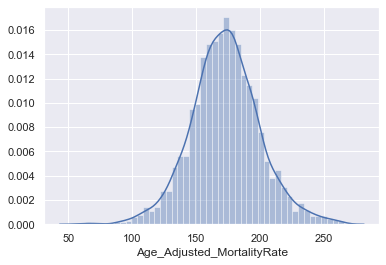

In [170]:
%matplotlib inline
sns.set()
sns.distplot(df['Age_Adjusted_MortalityRate'])


I have derive my own target to redefine the target(previously death rate) to a classification problem: To predict mortality rate is high or not

In [171]:
df['Age_Adjusted_MortalityRate'].mean()

172.87522845953

In [173]:
# if the death rate is greater than mean the risk of dying from cancer is very high
df['MortalityRisk']= pd.cut(x= df['Age_Adjusted_MortalityRate'], bins= [55,172,444 ], labels=['low', 'High' ])
df['MortalityRisk'].value_counts(normalize = True)

High    0.509791
low     0.490209
Name: MortalityRisk, dtype: float64

In [174]:
df.to_csv("final_data.csv")  
#read it back
print(df.shape)
pd.read_csv("final_data.csv", index_col = 0)

(3064, 17)


,CountyCode,State,MedHHInc,PovertyPct,County,TotalPopEst2016,PopwithHighSchoolDegree,ForeignBornPct,WhitePopPct,BlackPopPct,UnempRate2016,CountyState,Age_Adjusted_MortalityRate,AvgAnnualCount,recentTrend,Recent5yrdeathrate,MortalityRisk
1,1001,AL,58343.0,13.4,Autauga,55242.0,33.634410,2.113162,77.25,17.58,5.1,"Autauga County, Alabama",192.4,116,falling,-1.5,High
2,1003,AL,56607.0,10.1,Baldwin,207712.0,27.807610,3.248426,83.50,9.31,5.3,"Baldwin County, Alabama",169.6,459,falling,-1.1,low
3,1005,AL,32490.0,33.4,Barbour,25819.0,35.526744,2.660204,46.75,46.69,8.3,"Barbour County, Alabama",178.3,59,falling,-1.4,High
4,1007,AL,45795.0,20.2,Bibb,22576.0,43.874141,1.023029,75.02,21.92,6.4,"Bibb County, Alabama",197.2,52,falling,-0.8,High
5,1009,AL,48253.0,12.8,Blount,57517.0,32.273591,4.545060,88.89,1.26,5.4,"Blount County, Alabama",170.9,124,falling,-1.1,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3075,56037,WY,75590.0,10.0,Sweetwater,44275.0,33.539957,4.952052,80.88,0.95,6.1,"Sweetwater County, Wyoming",141.4,54,falling,-0.9,low
3076,56039,WY,90145.0,5.8,Teton,23161.0,12.993885,10.814466,82.21,0.15,3.5,"Teton County, Wyoming",110.2,23,falling,-2.6,low
3077,56041,WY,67404.0,10.2,Uinta,20691.0,37.378641,2.943443,88.53,0.23,5.8,"Uinta County, Wyoming",141.1,27,falling,-1.9,low
3078,56043,WY,57989.0,10.7,Washakie,8168.0,28.974584,2.338544,83.89,0.26,4.8,"Washakie County, Wyoming",151.0,18,stable,-1.1,low


How is your class distributed

In [175]:
# there are 2 classes, so it is a Binary Classification problem
y = df['MortalityRisk']
y.nunique()

2

Are the Class Imbalanced?

In [176]:
# the majority class occures with 50% frequency, so this is not  imbalanced, i could use accuracy score
y.value_counts(normalize = True)

High    0.509791
low     0.490209
Name: MortalityRisk, dtype: float64

In [187]:
df = pd.read_csv("final_data.csv", index_col = 0)
df.fillna(method='ffill', inplace = True)

#Split the data into train and test
from sklearn.model_selection import train_test_split
train , test = train_test_split(df, train_size = 0.80, test_size= 0.20, stratify= df['MortalityRisk'], random_state= 42)

# wrangle data

def wrangle(X):
    """Wrangle train, validate, and test sets in the same way"""
    
    # Prevent SettingWithCopyWarning
    X = X.copy()
    X = X[X['Age_Adjusted_MortalityRate'] <= np.percentile(X['Age_Adjusted_MortalityRate'], 99.5)]
    
    # 'Recent5yrdeathrate' column has highest feature importance
    # this look like a leakage, let's drop it
    X = X.drop(columns=['Age_Adjusted_MortalityRate','Recent5yrdeathrate','AvgAnnualCount','County','CountyCode'])
    
    # Convert Zipcode and CountyCode as object

    #X['CountyCode'] = X['CountyCode'].astype('str')
    
    #Drop the high cardinality features
    X = X.drop(columns =[ 'CountyState'])
    
     # Reset index
    X = X.reset_index(drop=True)
    
    return X
train = wrangle(train)
test = wrangle(test)
#val = wrangle(val)
train.shape, test.shape, train.columns

((2438, 11),
 (609, 11),
 Index(['State', 'MedHHInc', 'PovertyPct', 'TotalPopEst2016',
        'PopwithHighSchoolDegree', 'ForeignBornPct', 'WhitePopPct',
        'BlackPopPct', 'UnempRate2016', 'recentTrend', 'MortalityRisk'],
       dtype='object'))

In [188]:
target = 'MortalityRisk'
features = train.drop(columns= target).columns

X_train= train[features]
y_train = train[target]

X_test = test[features]
y_test= test[target]
X_train.shape, X_test.shape

((2438, 10), (609, 10))

In [61]:
# Check if our targets were stratified correctly
print('Train stratification:\n', y_train.value_counts(normalize=True))
print('Test stratification:\n', y_test.value_counts(normalize=True))

Train stratification:
 High    0.509388
low     0.490612
Name: MortalityRisk, dtype: float64
Test stratification:
 High    0.509804
low     0.490196
Name: MortalityRisk, dtype: float64


**Baseline Logistic Regression**

In [189]:
#with numerical features only
from sklearn.linear_model import LogisticRegression
def LReg(X_train, y_train):
    
    X_train = X_train.select_dtypes(include='number')
    model = LogisticRegression()
    model.fit(X_train, y_train)
    k = 5
    LRscores = cross_val_score(model, X_train, y_train, cv=k, scoring = 'accuracy' )
    print(f'Validation Acuuracy for {k} folds:', LRscores.mean())
    
LReg(X_train, y_train)

Validation Acuuracy for 5 folds: 0.7063225839027838


### XGBoost Model

In [183]:
# Nested cross validation for Hyperparameter optimization and evaluation

processor = make_pipeline(
    ce.OrdinalEncoder(),
    StandardScaler()
)

X_train_processed = processor.fit_transform(X_train)
X_test_processed = processor.fit(X_test)
# `outer_cv` creates 3 folds for estimating generalization error
outer_cv = KFold(3)

# when we train on a certain fold, we use a second cross-validation
# split in order to choose hyperparameters
inner_cv = KFold(3)
# give shorthand names to models and use those as dictionary keys mapping
# to models and parameter grids for that model

models_and_parameters = {
    'XGB': (XGBClassifier(),
           {'objective':['binary:logistic'],
              'learning_rate': [0.1], #so called `eta` value
              'max_depth': range(3,10,2),
              'min_child_weight': [1,7,13,15],
              'n_estimators': [25,50, 100,200,500],
              'max_features' : [25,50,100,150],})}

# we will collect the average of the scores on the 3 outer folds in this dictionary
# with keys given by the names of the models in `models_and_parameters`
average_scores_across_outer_folds_for_each_model = dict()

# find the model with the best generalization error
for name, (model, params) in models_and_parameters.items():
    # this object is a regressor that also happens to choose
    # its hyperparameters automatically using `inner_cv`
    regressor_that_optimizes_its_hyperparams = GridSearchCV(
        estimator=model, param_grid=params,
        cv=inner_cv, scoring='roc_auc')
    
    # estimate generalization error on the 3-fold splits of the data
    scores_across_outer_folds = cross_val_score(
        regressor_that_optimizes_its_hyperparams,
        X_train_processed, y_train, cv=outer_cv, scoring='roc_auc')
    
        # get the mean MSE across each of outer_cv's 3 folds
    average_scores_across_outer_folds_for_each_model[name] = np.mean(scores_across_outer_folds)
    accuracy_summary = 'Model: {name}\auc in the 3 outer folds: {scores}.\nAverage accuracy: {avg}'
    print(accuracy_summary.format(
        name=name, scores=scores_across_outer_folds,
        avg=np.mean(scores_across_outer_folds)))
    print()

print('Average score across the outer folds: ',
      average_scores_across_outer_folds_for_each_model)
many_stars = '\n' + '*' * 100 + '\n'
print(many_stars + 'Now we choose the best model and refit on the whole dataset' + many_stars)

best_model_name, best_model_avg_score = max(
    average_scores_across_outer_folds_for_each_model.items(),
    key=(lambda name_averagescore: name_averagescore[1]))

# get the best model and its associated parameter grid
best_model, best_model_params = models_and_parameters[best_model_name]

# now we refit this best model on the whole dataset so that we can start
# making predictions on other data, and now we have a reliable estimate of
# this model's generalization error and we are confident this is the best model
# among the ones we have tried
final_regressor = GridSearchCV(best_model, best_model_params, cv=inner_cv)
final_regressor.fit(X_train_processed, y_train)

print('Best model: \n\t{}'.format(best_model), end='\n\n')
print('Estimation of its accuracy:\n\t{}'.format(
    best_model_avg_score), end='\n\n')

print('Best parameter choice for this model: \n\t{params}'
      '\n(according to cross-validation `{cv}` on the whole dataset).'.format(
      params=final_regressor.best_params_, cv=inner_cv))


Model: XGBuc in the 3 outer folds: [0.81262235 0.85487781 0.85366382].
Average accuracy: 0.8403879933472275

Average score across the outer folds:  {'XGB': 0.8403879933472275}

****************************************************************************************************
Now we choose the best model and refit on the whole dataset
****************************************************************************************************

Best model: 
	XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

Estimation of its accuracy:
	0.8403879933472275

Best parameter choice for

In [190]:
gb_pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    StandardScaler(),
    XGBClassifier(n_estimators=100,    
                      max_depth=5,          
                      learning_rate=0.1,
                      min_child_weight = 7,
                      max_features = 25,
                      random_state=42,
                      n_jobs=-1)
)
gb_pipeline.fit(X_train, y_train)
k = 5
scores = cross_val_score(gb_pipeline, X_train, y_train, cv=k, 
                         scoring='roc_auc')
print(f'ROC AUC Score for {k} folds:', scores.mean())

ROC AUC Score for 5 folds: 0.8512957473463294


In [207]:
y_predict = gb_pipeline.predict(X_test)
Xgb_cv_score = cross_val_score(gb_pipeline, X_train, y_train, cv=k, scoring ='roc_auc')

print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, y_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, y_predict))
print('\n')
print("=== All AUC Scores ===")
print(Xgb_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - XGB Classifier: ", Xgb_cv_score.mean())

=== Confusion Matrix ===
[[237  72]
 [ 70 230]]


=== Classification Report ===
              precision    recall  f1-score   support

        High       0.77      0.77      0.77       309
         low       0.76      0.77      0.76       300

    accuracy                           0.77       609
   macro avg       0.77      0.77      0.77       609
weighted avg       0.77      0.77      0.77       609



=== All AUC Scores ===
[0.84941287 0.80081308 0.86389449 0.86241565 0.87994265]


=== Mean AUC Score ===
Mean AUC Score - XGB Classifier:  0.8512957473463294


In [208]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

def plot_confusion_matrix(y_true, y_pred):
    
    # Get label names from y target vector
    labels = unique_labels(y_true)
    
    # Set column labels for confusion matrix
    columns = [f'Predicted {label}' for label in labels]
    # Set index labels for confusion matrix
    index = [f'Actual {label}' for label in labels]
    
    # Create pandas dataframe to store info prior to plotting
    table = pd.DataFrame(confusion_matrix(y_true, y_pred),
                         columns=columns,
                         index=index)
    
    return sns.heatmap(table, annot=True, fmt='d', cmap='YlGnBu')

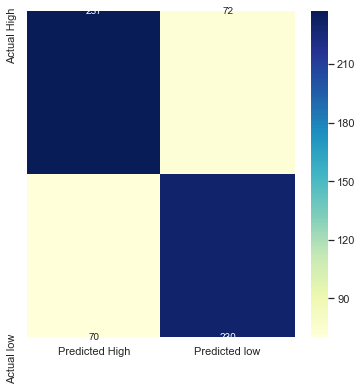

In [209]:
plt.figure(figsize=(6,6))
plot_confusion_matrix(y_test, y_predict);

### Pickle Pipline

In [68]:
from joblib import dump
dump(gb_pipeline, 'gb_pipeline.joblib', compress=True)

['gb_pipeline.joblib']

In [197]:
import joblib
import sklearn
import category_encoders as ce
import xgboost
print(f'joblib=={joblib.__version__}')
print(f'scikit-learn=={sklearn.__version__}')
print(f'category_encoders=={ce.__version__}')
print(f'xgboost=={xgboost.__version__}')

joblib==0.14.1
scikit-learn==0.22.1
category_encoders==2.1.0
xgboost==0.90


### Feature Importance

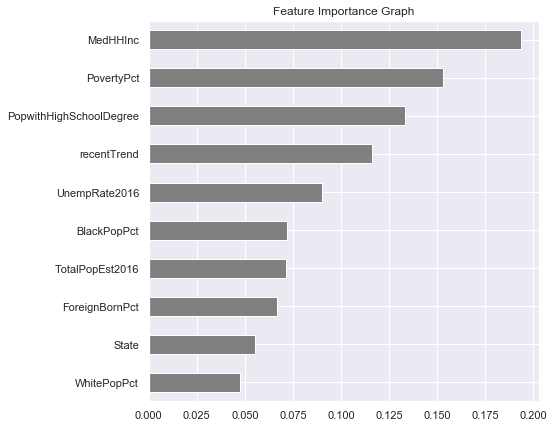

In [192]:
# Let's do a permutation importance to see just what the most important features are
%matplotlib inline
# Get feature importances
xgb_model =gb_pipeline.named_steps['xgbclassifier']
xgb_encoder = gb_pipeline.named_steps['ordinalencoder']
importances = pd.Series(xgb_model.feature_importances_, X_train.columns)

# Plot feature importances
n=10
plt.figure(figsize=(7, 7))
plt.title('Feature Importance Graph')
importances.sort_values()[-n:].plot.barh(color='grey');

### Permutation Importance

In [193]:
#How much the score decreases when a feature is not available.
import eli5
from eli5.sklearn import PermutationImportance

X_train_encoded =xgb_encoder.transform(X_train)
X_test_encoded = xgb_encoder.transform(X_test)

permuter = PermutationImportance(
    gb_pipeline,
    scoring='roc_auc',
    n_iter=10,
    random_state=42
)
permuter.fit(X_test_encoded, y_test)
eli5.show_weights(
    permuter,
    top=None,
    feature_names=X_test.columns.tolist()
)

Weight,Feature
0.0608 ± 0.0118,PopwithHighSchoolDegree
0.0469 ± 0.0162,BlackPopPct
0.0348 ± 0.0141,MedHHInc
0.0317 ± 0.0129,PovertyPct
0.0185 ± 0.0074,WhitePopPct
0.0167 ± 0.0091,TotalPopEst2016
0.0067 ± 0.0066,ForeignBornPct
0.0047 ± 0.0073,UnempRate2016
0 ± 0.0000,recentTrend
0 ± 0.0000,State


### Partial Dependence Plot

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x204330fcb88>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x20433200608>})

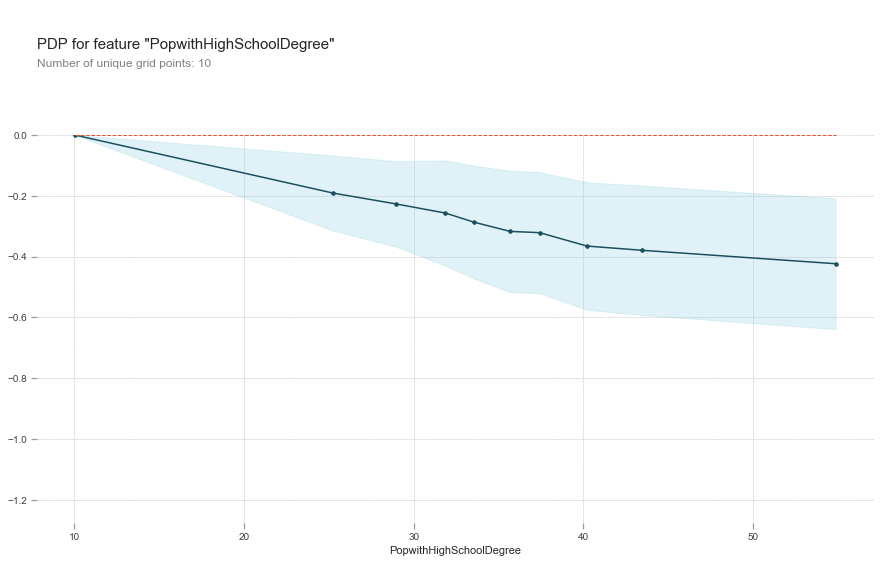

In [198]:
feature = 'PopwithHighSchoolDegree'

isolated = pdp_isolate(
    model = gb_pipeline,
    dataset=X_test,
    model_features=X_test.columns,
    feature=feature,
)

pdp_plot(isolated, feature_name=feature)
#plt.xlim(20, 55)

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x20428f85948>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x204332b2648>})

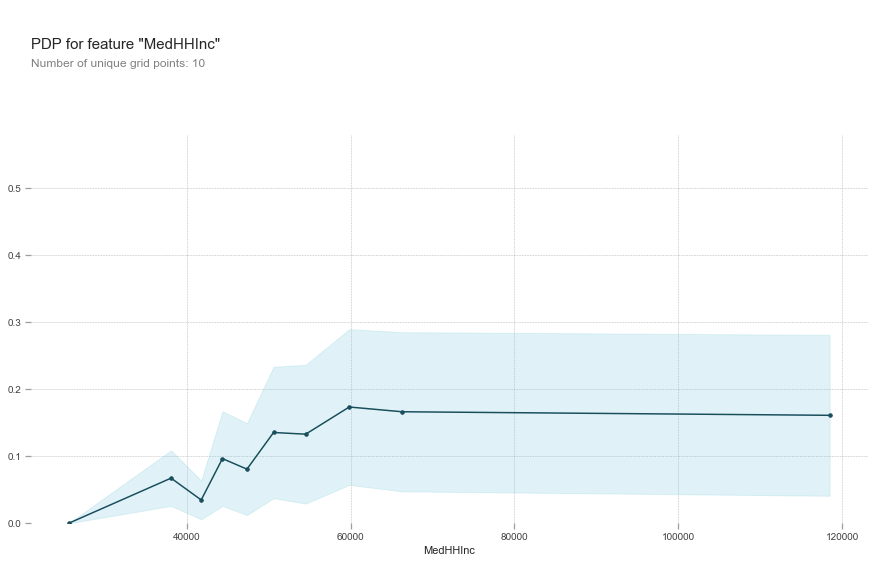

In [199]:
plt.rcParams['figure.dpi'] = 72

feature = 'MedHHInc'

isolated = pdp_isolate(
    model = gb_pipeline,
    dataset=X_test,
    model_features=X_test.columns,
    feature=feature,
)

pdp_plot(isolated, feature_name=feature)

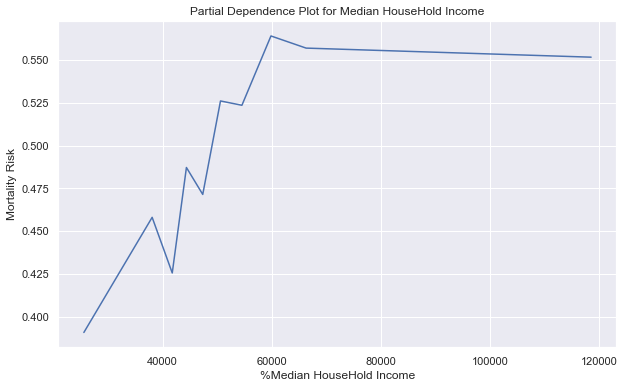

In [200]:
grid = isolated.feature_grids
pdp = isolated.pdp
plt.figure(figsize=(10,6))
plt.plot(grid, pdp)
plt.ylabel('Mortality Risk')
plt.xlabel('%Median HouseHold Income')
plt.title('Partial Dependence Plot for Median HouseHold Income');

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x20433266308>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x204335f3e48>})

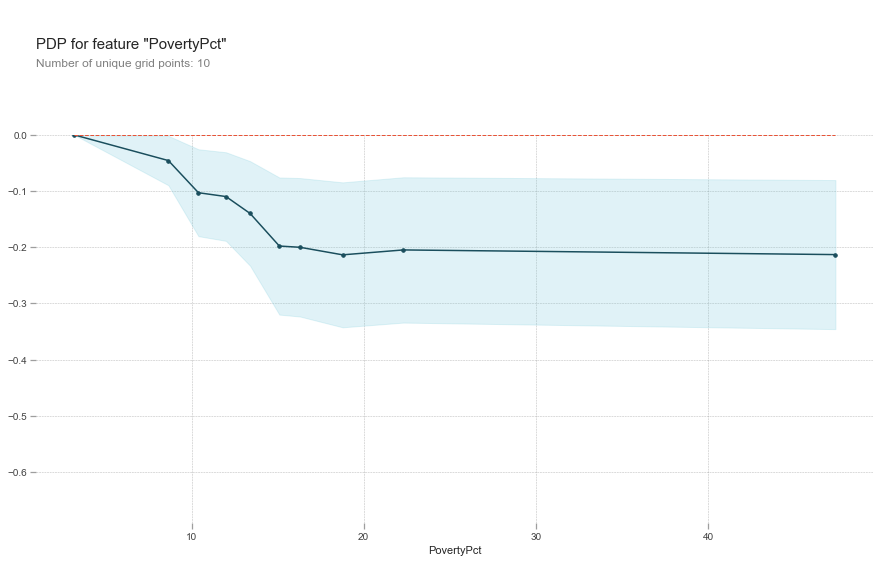

In [201]:
plt.rcParams['figure.dpi'] = 72

feature = 'PovertyPct'

isolated= pdp_isolate(
    model = gb_pipeline,
    dataset=X_test,
    model_features=X_test.columns,
    feature=feature
)

pdp_plot(isolated, feature_name=feature)


### SHAP Values

how model work for the indivisual prediction 

In [203]:
xgb_model =gb_pipeline.named_steps['xgbclassifier']
xgb_encoder = gb_pipeline.named_steps['ordinalencoder']
row = X_test.iloc[[1]]

explainer = shap.TreeExplainer(xgb_model)
row_encoded = xgb_encoder.transform(row)
shap_values = explainer.shap_values(row_encoded)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value,
    shap_values=shap_values,
    features=row
)

In [204]:
xgb_model =gb_pipeline.named_steps['xgbclassifier']
xgb_encoder = gb_pipeline.named_steps['ordinalencoder']
row = X_test.iloc[[5]]

explainer = shap.TreeExplainer(xgb_model)
row_encoded = xgb_encoder.transform(row)
shap_values = explainer.shap_values(row_encoded)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value,
    shap_values=shap_values,
    features=row
)

In [ ]:
feature = 'PovertyPct'

isolated= pdp_isolate(
    model = gb_pipeline,
    dataset=X_test,
    model_features=X_test.columns,
    feature=feature
)

pdp_plot(isolated, feature_name=feature)


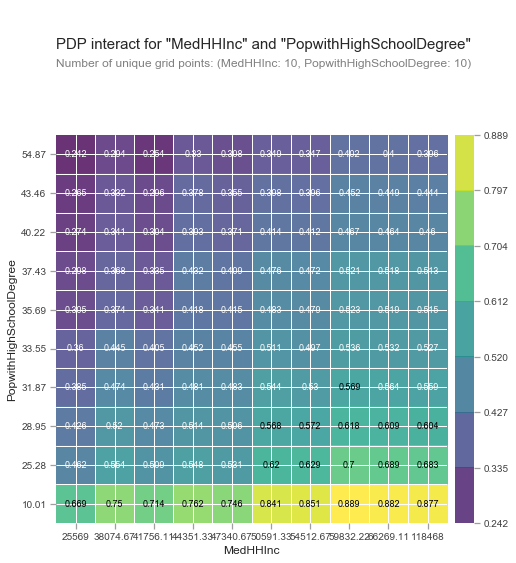

In [216]:
from pdpbox.pdp import pdp_isolate, pdp_interact, pdp_interact_plot
features = ['MedHHInc', 'PopwithHighSchoolDegree']

interaction = pdp_interact(
    model=gb_pipeline, 
    dataset=X_test, 
    model_features=X_test.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

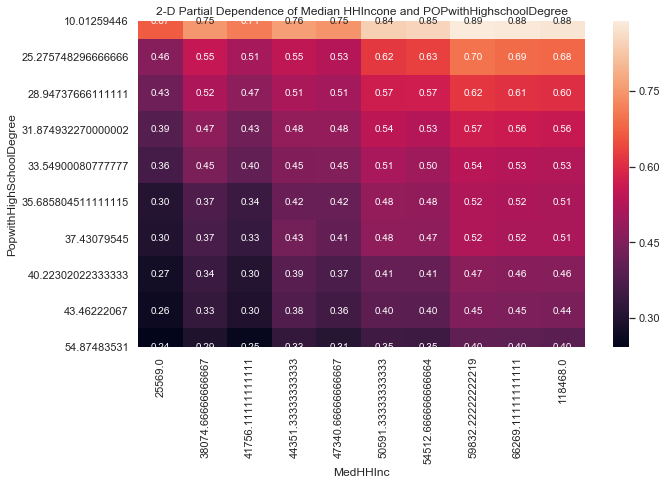

In [217]:
pdp = interaction.pdp.pivot_table(
    values='preds',
    columns=features[0],
    index=features[1]
)

plt.figure(figsize=(10,6))
sns.heatmap(pdp, annot=True, fmt='.2f')
plt.title('2-D Partial Dependence of Median HHIncone and POPwithHighschoolDegree');